<a href="https://www.kaggle.com/code/lalit7881/rfm-based-customer-segmentation-dataset?scriptVersionId=299924513" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/raw-sales-dataset-for-rfm-customer-segmentation/README.md
/kaggle/input/raw-sales-dataset-for-rfm-customer-segmentation/RFM_Analysis.pdf
/kaggle/input/raw-sales-dataset-for-rfm-customer-segmentation/raw_rfm_sales_transactions_30000.csv


In [2]:
df = pd.read_csv("/kaggle/input/raw-sales-dataset-for-rfm-customer-segmentation/raw_rfm_sales_transactions_30000.csv")

In [3]:
df.head()

,Transaction ID,Date,Product ID,Product Name,Product Category,Quantity,PPU,Amount
0,Customer-001,Yangon,NaN,NaN,NaN,NaN,NaN,NaN
1,T000001,01.01.2025,PROD-008,Executive Ballpoint Pen Box,Office Supplies,8.0,"70,000","560,000"
2,T000002,01.01.2025,PROD-002,Wireless Mechanical Keyboard,Electronics,10.0,"380,000","3,800,000"
3,T000003,01.01.2025,PROD-004,Standing Desk Converter,Furniture,6.0,"500,000","3,000,000"
4,T000004,01.01.2025,PROD-006,A4 Printer Paper (500 Sheets),Office Supplies,3.0,"25,500","76,500"


In [4]:
df.tail()

,Transaction ID,Date,Product ID,Product Name,Product Category,Quantity,PPU,Amount
30095,T029544,24.06.2025,PROD-007,USB-C Docking Station,Electronics,4.0,"340,000","1,360,000"
30096,T029545,24.06.2025,PROD-006,A4 Printer Paper (500 Sheets),Office Supplies,2.0,"25,500","51,000"
30097,T029612,25.06.2025,PROD-008,Executive Ballpoint Pen Box,Office Supplies,10.0,"70,000","700,000"
30098,T029681,26.06.2025,PROD-003,27-inch 4K Monitor,Electronics,6.0,"1,200,000","7,200,000"
30099,T029829,28.06.2025,PROD-006,A4 Printer Paper (500 Sheets),Office Supplies,6.0,"25,500","153,000"


In [5]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30100 entries, 0 to 30099
Data columns (total 8 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   Transaction ID    30100 non-null  object 
 1   Date              30100 non-null  object 
 2   Product ID        30000 non-null  object 
 3   Product Name      30000 non-null  object 
 4   Product Category  30000 non-null  object 
 5   Quantity          30000 non-null  float64
 6   PPU               30000 non-null  object 
 7   Amount            30000 non-null  object 
dtypes: float64(1), object(7)
memory usage: 1.8+ MB


In [6]:
df.describe()

,Quantity
count,30000.000000
mean,5.490067
std,2.880008
min,1.000000
25%,3.000000
50%,5.000000
75%,8.000000
max,10.000000


In [7]:
df.dtypes

Transaction ID       object
Date                 object
Product ID           object
Product Name         object
Product Category     object
Quantity            float64
PPU                  object
Amount               object
dtype: object

In [8]:
df.shape

(30100, 8)

In [9]:
df.isnull().sum()

Transaction ID        0
Date                  0
Product ID          100
Product Name        100
Product Category    100
Quantity            100
PPU                 100
Amount              100
dtype: int64

In [10]:
df.duplicated().sum()

np.int64(0)

In [11]:
df.columns

Index(['Transaction ID', 'Date', 'Product ID', 'Product Name',
       'Product Category', 'Quantity', 'PPU', 'Amount'],
      dtype='object')

In [12]:
df.nunique()

Transaction ID      30100
Date                  186
Product ID             10
Product Name           10
Product Category        3
Quantity               10
PPU                    10
Amount                 91
dtype: int64

## EDA

In [13]:
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10,6)

In [14]:
df.columns = df.columns.str.strip()

# Convert Date column
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')

# Drop rows with invalid dates
df = df.dropna(subset=['Date'])

# Create time features
df['Year'] = df['Date'].dt.year
df['Month'] = df['Date'].dt.month
df['Month_Name'] = df['Date'].dt.month_name()

# Set visualization style
sns.set(style="whitegrid")
plt.rcParams['figure.figsize'] = (10,6)

In [15]:
monthly_sales = df.groupby('Month')['Amount'].sum().reset_index()

plt.figure()
sns.barplot(data=monthly_sales, x='Month', y='Amount', palette='viridis')

plt.title("Monthly Revenue Trend", fontsize=14, fontweight='bold')
plt.xlabel("Month")
plt.ylabel("Total Revenue")
plt.show()

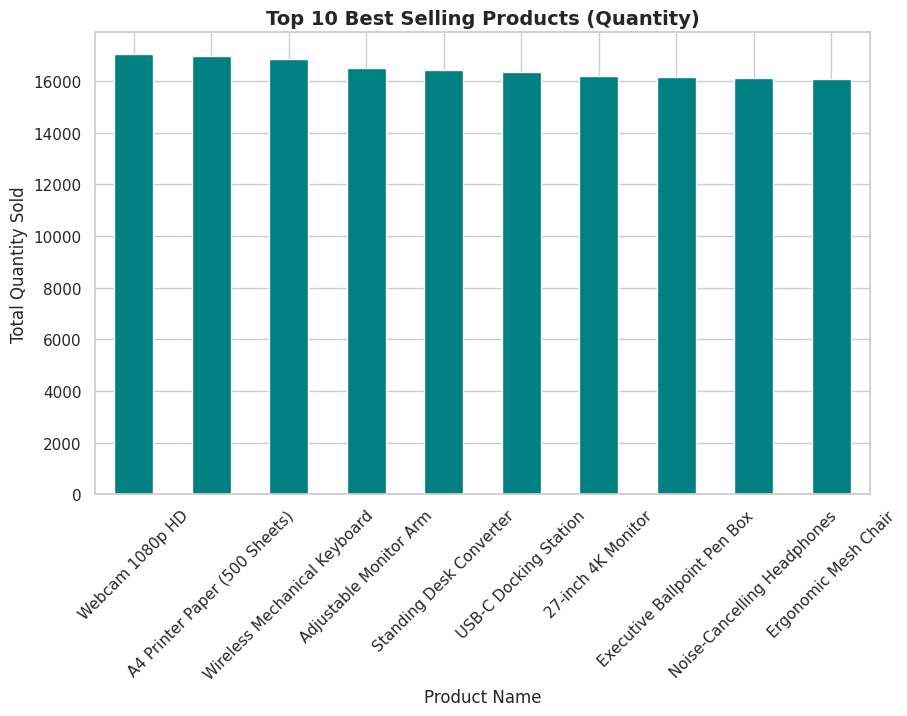

In [16]:
top_products = df.groupby('Product Name')['Quantity'].sum().sort_values(ascending=False).head(10)

plt.figure()
top_products.plot(kind='bar', color='teal')
plt.title("Top 10 Best Selling Products (Quantity)", fontsize=14, fontweight='bold')
plt.ylabel("Total Quantity Sold")
plt.xticks(rotation=45)
plt.show()

In [17]:
category_sales = df.groupby('Product Category')['Amount'].sum().reset_index()

plt.figure()
sns.barplot(data=category_sales, x='Product Category', y='Amount', palette='Set2')
plt.title("Revenue by Product Category", fontsize=14, fontweight='bold')
plt.xticks(rotation=45)
plt.ylabel("Total Revenue")
plt.show()

In [18]:
df['Amount'] = (
    df['Amount']
      .astype(str)
      .str.replace(',', '', regex=False)
)

df['Amount'] = pd.to_numeric(df['Amount'], errors='coerce')

# Drop missing values
df = df.dropna(subset=['Amount'])

print(df['Amount'].dtype)

int64


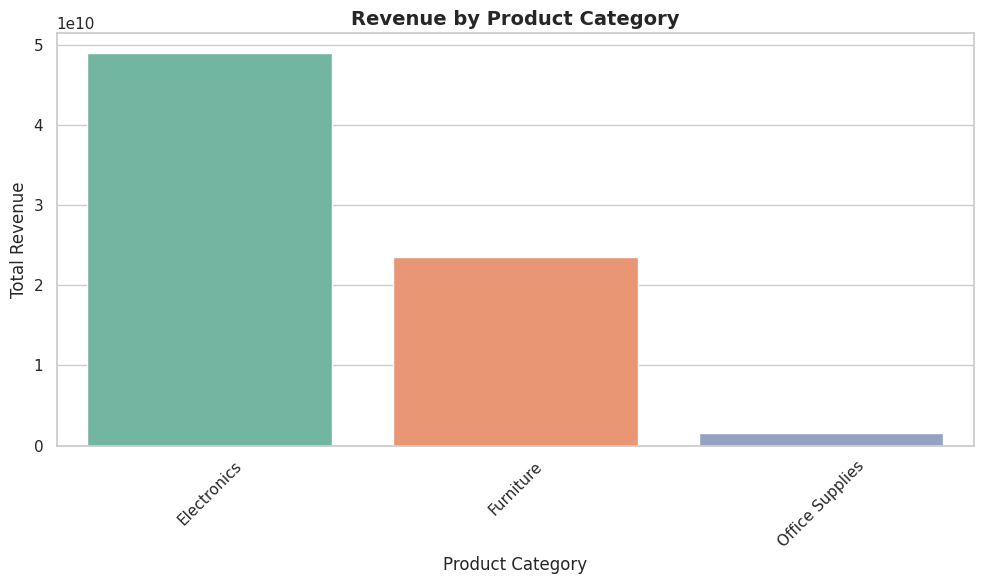

In [19]:
category_sales = (
    df.groupby('Product Category')['Amount']
      .sum()
      .sort_values(ascending=False)
      .reset_index()
)

plt.figure(figsize=(10,6))

sns.barplot(
    data=category_sales,
    x='Product Category',
    y='Amount',
    palette='Set2'
)

plt.title("Revenue by Product Category", fontsize=14, fontweight='bold')
plt.xlabel("Product Category")
plt.ylabel("Total Revenue")
plt.xticks(rotation=45)

plt.tight_layout()
plt.show()

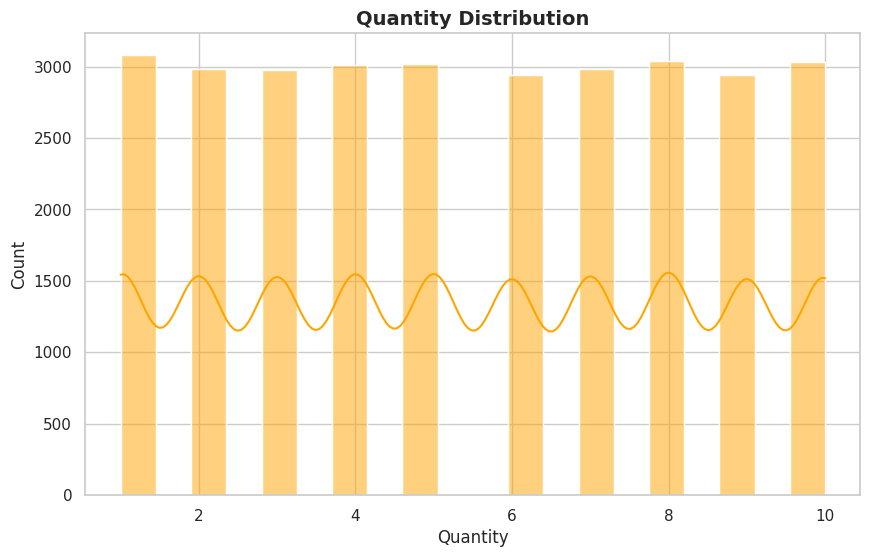

In [20]:
plt.figure()
sns.histplot(df['Quantity'], bins=20, kde=True, color='orange')
plt.title("Quantity Distribution", fontsize=14, fontweight='bold')
plt.xlabel("Quantity")
plt.show()

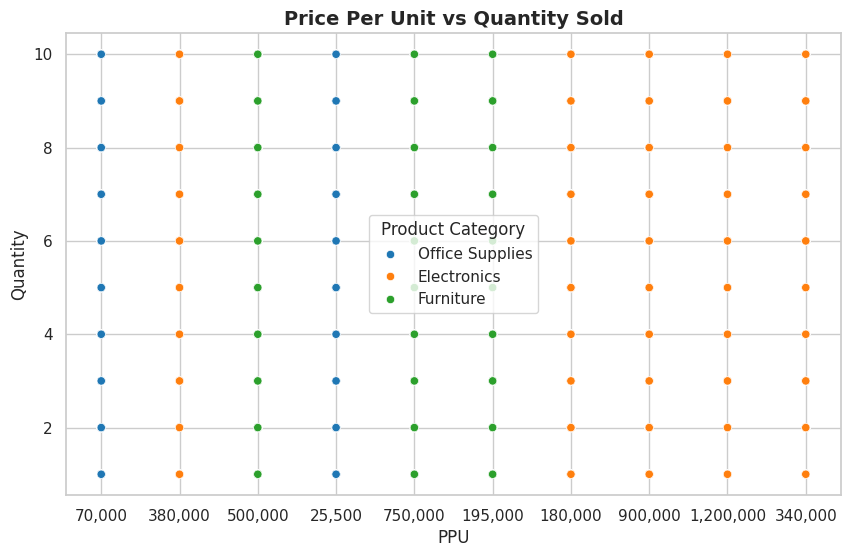

In [21]:
plt.figure()
sns.scatterplot(data=df, x='PPU', y='Quantity', hue='Product Category', palette='tab10')
plt.title("Price Per Unit vs Quantity Sold", fontsize=14, fontweight='bold')
plt.show()

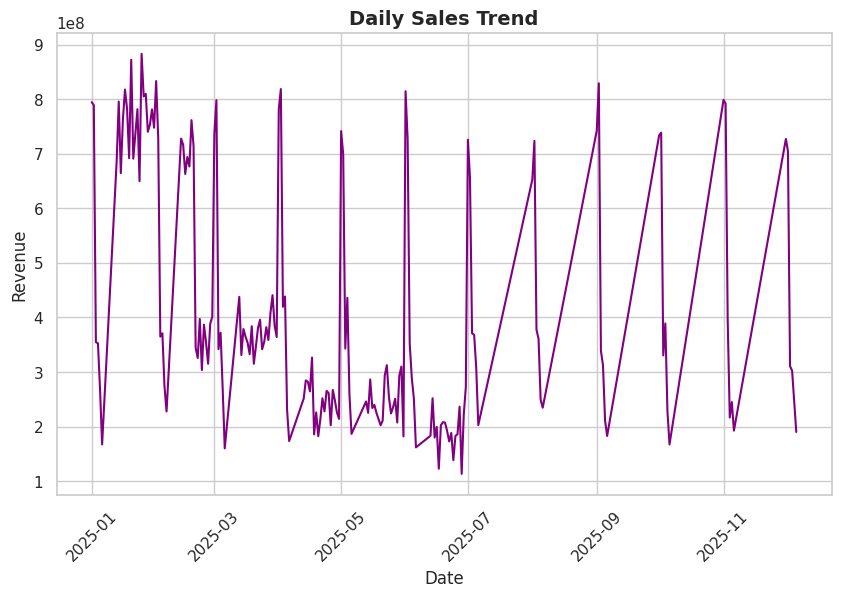

In [22]:
daily_sales = df.groupby('Date')['Amount'].sum().reset_index()

plt.figure()
plt.plot(daily_sales['Date'], daily_sales['Amount'], color='purple')
plt.title("Daily Sales Trend", fontsize=14, fontweight='bold')
plt.xlabel("Date")
plt.ylabel("Revenue")
plt.xticks(rotation=45)
plt.show()

In [23]:
cols_to_clean = ['Quantity', 'PPU', 'Amount']

for col in cols_to_clean:
    df[col] = df[col].astype(str).str.replace(',', '')
    df[col] = pd.to_numeric(df[col], errors='coerce')

# Check datatypes
print(df.dtypes)

Transaction ID              object
Date                datetime64[ns]
Product ID                  object
Product Name                object
Product Category            object
Quantity                   float64
PPU                          int64
Amount                       int64
Year                         int32
Month                        int32
Month_Name                  object
dtype: object


In [24]:
df = df.dropna(subset=['Quantity', 'PPU', 'Amount'])

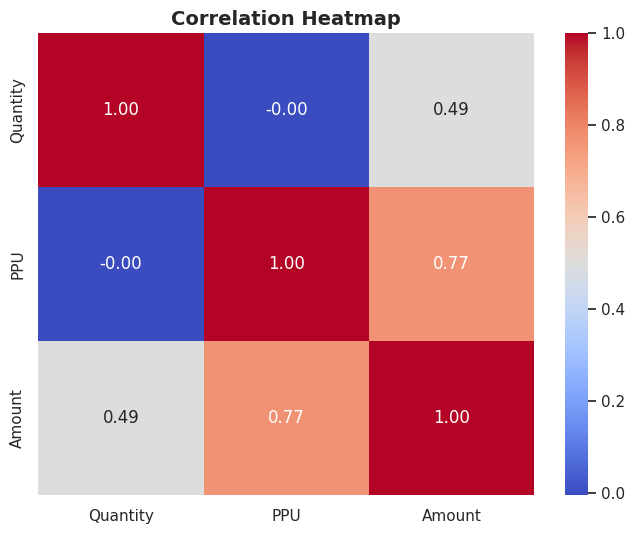

In [25]:
plt.figure(figsize=(8,6))
sns.heatmap(
    df[['Quantity','PPU','Amount']].corr(),
    annot=True,
    cmap='coolwarm',
    fmt='.2f'
)

plt.title("Correlation Heatmap", fontsize=14, fontweight='bold')
plt.show()

In [26]:
df['Amount'] = df['Amount'].astype(str).str.replace(',', '')
df['Amount'] = pd.to_numeric(df['Amount'], errors='coerce')

# Drop missing values
df = df.dropna(subset=['Amount'])

# Confirm datatype
print(df['Amount'].dtype)

int64


In [27]:
top_revenue_product = (
    df.groupby('Product Name')['Amount']
      .sum()
      .sort_values(ascending=False)
      .head(10)
)

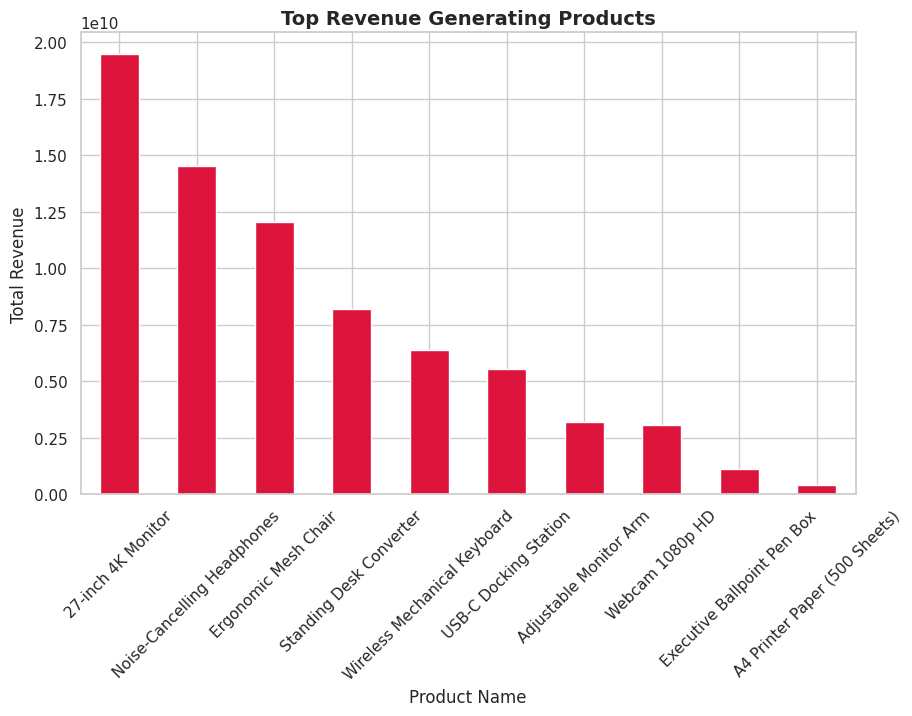

In [28]:
plt.figure(figsize=(10,6))
top_revenue_product.plot(kind='bar', color='crimson')

plt.title("Top Revenue Generating Products", fontsize=14, fontweight='bold')
plt.ylabel("Total Revenue")
plt.xticks(rotation=45)
plt.show()

## Feature engineering

In [29]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

# ML Algorithms
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier

In [30]:
df.columns = df.columns.str.strip()

# Convert Date
df['Date'] = pd.to_datetime(df['Date'], errors='coerce')
df = df.dropna(subset=['Date'])

# Create target column (High Value Transaction)
median_amount = df['Amount'].median()
df['Target'] = np.where(df['Amount'] > median_amount, 1, 0)

# Drop leakage columns
df = df.drop(['Transaction ID'], axis=1)


In [31]:
X = df.drop('Target', axis=1)
y = df['Target']

# Identify categorical & numeric columns
categorical_cols = ['Product ID', 'Product Name', 'Product Category']
numeric_cols = ['Quantity', 'PPU']


X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42, stratify=y
)


In [32]:
preprocessor = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(), numeric_cols),
        ('cat', OneHotEncoder(handle_unknown='ignore'), categorical_cols)
    ]
)

In [33]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "Gradient Boosting": GradientBoostingClassifier(),
    "SVM": SVC(),
    "KNN": KNeighborsClassifier()
}


In [34]:
results = {}

for name, model in models.items():
    
    pipeline = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('classifier', model)
    ])
    
    pipeline.fit(X_train, y_train)
    
    y_pred = pipeline.predict(X_test)
    
    acc = accuracy_score(y_test, y_pred)
    results[name] = acc
    
    print(f"\n{name}")
    print("Accuracy:", acc)
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("Classification Report:")
    print(classification_report(y_test, y_pred))



Logistic Regression
Accuracy: 1.0
Confusion Matrix:
[[3021    0]
 [   0 2979]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3021
           1       1.00      1.00      1.00      2979

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000


Decision Tree
Accuracy: 1.0
Confusion Matrix:
[[3021    0]
 [   0 2979]]
Classification Report:
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3021
           1       1.00      1.00      1.00      2979

    accuracy                           1.00      6000
   macro avg       1.00      1.00      1.00      6000
weighted avg       1.00      1.00      1.00      6000


Random Forest
Accuracy: 1.0
Confusion Matrix:
[[3021    0]
 [   0 2979]]
Classification Report:
              precision    recall  f1-score   sup

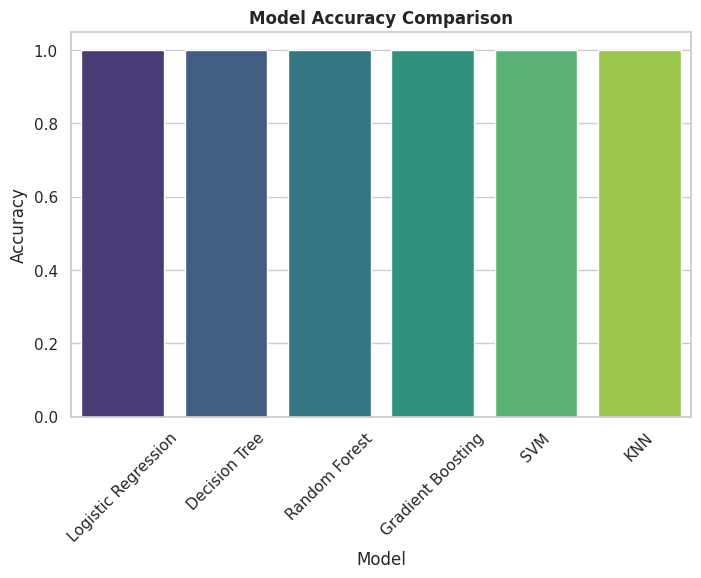

In [35]:
results_df = pd.DataFrame(results.items(), columns=['Model', 'Accuracy'])

plt.figure(figsize=(8,5))
sns.barplot(data=results_df, x='Model', y='Accuracy', palette='viridis')
plt.xticks(rotation=45)
plt.title("Model Accuracy Comparison", fontweight='bold')
plt.show()

## Thank you..pls upvote!!!